# <font color='seagreen'>LEAD SCORING CASE STUDY

<br>

### <font color='royalblue'>PROBLEM STATEMENT<br>

    
* Help is needed for an X Education to identify the most promising leads—those that have the highest chance of becoming clients.
* The business wants us to create a model in which every lead must be given a lead score, meaning that consumers who have higher lead scores are more likely to convert than those who have lower lead scores.
* The intended lead conversion rate, as stated by the CEO in particular, is approximately 80%.
<br>
    
### <font color='royalblue'>OBJECTIVE<br>

* Build a logistic regression model that will allow the business to target potential leads by giving each lead a score between 0 and 100. 
* A higher score would indicate that the lead is hot and likely to convert.
* A lower number would indicate that the lead is cold and unlikely to convert.

<br>

In [1]:
# Importing Required Packages

# for data analysis
import pandas as pd
import numpy as np

# for data visualisation
import matplotlib.pyplot as plt
import seaborn as sns

# data pre-processing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

# to supress warnings
import warnings
warnings.filterwarnings('ignore')

# Model Building
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
import statsmodels.api as sm

# for model evaluation
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import r2_score

# Model Evaluation
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve

<br>

### <font color='purple'>Step (1) : Reading and Understanding the Data<br>

In [2]:
# Reading the dataset
df = pd.read_csv("Leads.csv", engine= "python")
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [3]:
# Dimensions of data
df.shape

(9240, 37)

In [4]:
# Information about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [5]:
# Describing numeric columns
df.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [6]:
# Display all columns
pd.set_option("display.max_columns", 40)
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [7]:
# Column names
df.columns

Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source',
       'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'Country', 'Specialization', 'How did you hear about X Education',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags', 'Lead Quality',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'Lead Profile', 'City', 'Asymmetrique Activity Index',
       'Asymmetrique Profile Index', 'Asymmetrique Activity Score',
       'Asymmetrique Profile Score',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

#### <font color='darkgreen'>................ Step (1) : Data Understanding Completed! ................<br>

<br>

### <font color='purple'>Step (2) : Data Cleaning<br>

In [8]:
# Replacing "Select" with null value as it could be select because the field entry might be optional.
# Users might not have selected any value.
df = df.replace("Select", np.nan)

<br>

**`(2.1): Check for Duplicate Records`**

In [9]:
# "Prospect ID" is a unique id for every customer. Checking if it has duplicate records.
df['Prospect ID'].nunique()

9240

In [10]:
# "Lead Number" is a number assigned to each lead. Checking if it has duplicate records.
df['Lead Number'].nunique()

9240

* As columns 'Prospect ID' and 'Lead Number' have unique records equal to the total number of rows in the dataframe, these columns have no duplicate records.
* Hence, there are **no duplicate entries** in the dataset.

<br>

**`(2.2): Missing Value Treatment`**

In [11]:
# Checking for unique records in each column.
df.nunique()

Prospect ID                                      9240
Lead Number                                      9240
Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        41
Total Time Spent on Website                      1731
Page Views Per Visit                              114
Last Activity                                      17
Country                                            38
Specialization                                     18
How did you hear about X Education                  9
What is your current occupation                     6
What matters most to you in choosing a course       3
Search                                              2
Magazine                                            1
Newspaper Article           

In [12]:
# Getting all those columns which have only 1 common class throughout.
df_single = df.loc[:, df.nunique()==1]
single_class_cols = df_single.columns.to_list()
single_class_cols

['Magazine',
 'Receive More Updates About Our Courses',
 'Update me on Supply Chain Content',
 'Get updates on DM Content',
 'I agree to pay the amount through cheque']

In [13]:
# Dropping these columns as they have only 1 class and thus won't have any effect on variations in target column 'Converted'
df.drop(columns= single_class_cols, inplace= True)
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,Lead Quality,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,NaN,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,Interested in other courses,Low in Relevance,NaN,NaN,02.Medium,02.Medium,15.0,15.0,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,NaN,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,Ringing,NaN,NaN,NaN,02.Medium,02.Medium,15.0,15.0,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,NaN,Student,Better Career Prospects,No,No,No,No,No,No,Will revert after reading the email,Might be,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,Ringing,Not Sure,NaN,Mumbai,02.Medium,01.High,13.0,17.0,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,NaN,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,Will revert after reading the email,Might be,NaN,Mumbai,02.Medium,01.High,15.0,18.0,No,Modified


In [14]:
# Checking dimensions
df.shape

(9240, 32)

In [15]:
# Checking for null values %
round(100*df.isnull().sum()/df.shape[0],2)

Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   36.58
How did you hear about X Education               78.46
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Newspaper Article                                 0.00
X Educatio

In [16]:
# Dropping all columns with missing values >= 40%
for col in df.columns:
    if((100*(df[col].isnull().sum()/df.shape[0])) >= 40):
        df.drop(col, axis= 1, inplace= True)

In [17]:
# Checking null values again
round(100*df.isnull().sum()/df.shape[0],2)

Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   36.58
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper 

In [18]:
# Dimensions of data
df.shape

(9240, 25)

In [19]:
# Checking data types of columns
df.dtypes

Prospect ID                                       object
Lead Number                                        int64
Lead Origin                                       object
Lead Source                                       object
Do Not Email                                      object
Do Not Call                                       object
Converted                                          int64
TotalVisits                                      float64
Total Time Spent on Website                        int64
Page Views Per Visit                             float64
Last Activity                                     object
Country                                           object
Specialization                                    object
What is your current occupation                   object
What matters most to you in choosing a course     object
Search                                            object
Newspaper Article                                 object
X Education Forums             

**Considering individual Columns**<br>

**Col (1) - Lead Source**

In [20]:
# Checking distribution
round(100* df['Lead Source'].value_counts(normalize= True, dropna= False),2)

Google               31.04
Direct Traffic       27.52
Olark Chat           18.99
Organic Search       12.49
Reference             5.78
Welingak Website      1.54
Referral Sites        1.35
Facebook              0.60
NaN                   0.39
bing                  0.06
google                0.05
Click2call            0.04
Press_Release         0.02
Social Media          0.02
Live Chat             0.02
youtubechannel        0.01
testone               0.01
Pay per Click Ads     0.01
welearnblog_Home      0.01
WeLearn               0.01
blog                  0.01
NC_EDM                0.01
Name: Lead Source, dtype: float64

In [21]:
# Replacing null values with mode value i.e. 'Google' as it has only 0.39% missing values
lead_source_mode = df['Lead Source'].mode()[0]
df['Lead Source'] = df['Lead Source'].fillna(lead_source_mode)

In [22]:
# Also, there are some entries of 'Google' as 'google'. Replacing such entries
df['Lead Source'] = df['Lead Source'].replace('google', 'Google')

**Col (2) - Last Activity**

In [23]:
# Checking distribution
round(100* df['Last Activity'].value_counts(normalize= True, dropna= False),2)

Email Opened                    37.20
SMS Sent                        29.71
Olark Chat Conversation         10.53
Page Visited on Website          6.93
Converted to Lead                4.63
Email Bounced                    3.53
Email Link Clicked               2.89
Form Submitted on Website        1.26
NaN                              1.11
Unreachable                      1.01
Unsubscribed                     0.66
Had a Phone Conversation         0.32
Approached upfront               0.10
View in browser link Clicked     0.06
Email Received                   0.02
Email Marked Spam                0.02
Visited Booth in Tradeshow       0.01
Resubscribed to emails           0.01
Name: Last Activity, dtype: float64

In [24]:
# Replacing null values with mode - 'Email Opened' as it has around 1% missing values 
last_activity_mode = df['Last Activity'].mode()[0]
df['Last Activity'] = df['Last Activity'].fillna(last_activity_mode)

**Col (3) - Country**

In [25]:
# Checking the distribution
round(100* df['Country'].value_counts(normalize= True, dropna=False),2)

India                   70.26
NaN                     26.63
United States            0.75
United Arab Emirates     0.57
Singapore                0.26
Saudi Arabia             0.23
United Kingdom           0.16
Australia                0.14
Qatar                    0.11
Bahrain                  0.08
Hong Kong                0.08
Oman                     0.06
France                   0.06
unknown                  0.05
Kuwait                   0.04
South Africa             0.04
Canada                   0.04
Nigeria                  0.04
Germany                  0.04
Sweden                   0.03
Philippines              0.02
Uganda                   0.02
Italy                    0.02
Bangladesh               0.02
Netherlands              0.02
Asia/Pacific Region      0.02
China                    0.02
Belgium                  0.02
Ghana                    0.02
Kenya                    0.01
Sri Lanka                0.01
Tanzania                 0.01
Malaysia                 0.01
Liberia   

In [26]:
# As the fraction of null values is high (~27%), creating a new category 'Not Specified'
df['Country'] = df['Country'].replace(np.nan, "Not Specified")

**Col (4) - Specialization**

In [27]:
# Checking the distribution
round(100* df['Specialization'].value_counts(normalize= True, dropna=False),2)

NaN                                  36.58
Finance Management                   10.56
Human Resource Management             9.18
Marketing Management                  9.07
Operations Management                 5.44
Business Administration               4.36
IT Projects Management                3.96
Supply Chain Management               3.78
Banking, Investment And Insurance     3.66
Travel and Tourism                    2.20
Media and Advertising                 2.20
International Business                1.93
Healthcare Management                 1.72
Hospitality Management                1.23
E-COMMERCE                            1.21
Retail Management                     1.08
Rural and Agribusiness                0.79
E-Business                            0.62
Services Excellence                   0.43
Name: Specialization, dtype: float64

In [28]:
# As the fraction of null values is high (~37%), creating a new category 'Not Specified'
df['Specialization'] = df['Specialization'].replace(np.nan, "Not Specified")

**Col (5) - What is your current occupation**

In [29]:
# Checking the distribution
round(100* df['What is your current occupation'].value_counts(normalize= True, dropna=False),2)

Unemployed              60.61
NaN                     29.11
Working Professional     7.64
Student                  2.27
Other                    0.17
Housewife                0.11
Businessman              0.09
Name: What is your current occupation, dtype: float64

In [30]:
# As the fraction of null values is high (~29%), creating a new category 'Not Specified'
df['What is your current occupation'] = df['What is your current occupation'].replace(np.nan, "Not Specified")

**Col (6) - What matters most to you in choosing a course**

In [31]:
# Checking the distribution
round(100* df['What matters most to you in choosing a course'].value_counts(normalize= True, dropna=False),2)

Better Career Prospects      70.65
NaN                          29.32
Flexibility & Convenience     0.02
Other                         0.01
Name: What matters most to you in choosing a course, dtype: float64

In [32]:
# As the fraction of null values is high (~29%), creating a new category 'Not Specified'
df['What matters most to you in choosing a course'] = df['What matters most to you in choosing a course'].replace(np.nan, "Not Specified")

In [33]:
# Checking the null values
round(100*df.isnull().sum()/df.shape[0],2)

Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     0.00
Country                                           0.00
Specialization                                    0.00
What is your current occupation                   0.00
What matters most to you in choosing a course     0.00
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper 

**Col (7) - Tags**

In [34]:
# Checking the distribution
round(100* df['Tags'].value_counts(normalize= True, dropna=False),2)

NaN                                                  36.29
Will revert after reading the email                  22.42
Ringing                                              13.02
Interested in other courses                           5.55
Already a student                                     5.03
Closed by Horizzon                                    3.87
switched off                                          2.60
Busy                                                  2.01
Lost to EINS                                          1.89
Not doing further education                           1.57
Interested  in full time MBA                          1.27
Graduation in progress                                1.20
invalid number                                        0.90
Diploma holder (Not Eligible)                         0.68
wrong number given                                    0.51
opp hangup                                            0.36
number not provided                                   0.

In [35]:
# As the fraction of null values is high (~36%), creating a new category
df['Tags'] = df['Tags'].replace(np.nan, "Not Specified")

**Col (8) - City**

In [36]:
# Checking the distribution
round(100* df['City'].value_counts(normalize= True, dropna=False),2)

NaN                            39.71
Mumbai                         34.87
Thane & Outskirts               8.14
Other Cities                    7.42
Other Cities of Maharashtra     4.95
Other Metro Cities              4.11
Tier II Cities                  0.80
Name: City, dtype: float64

In [37]:
# As the fraction of null values is high (~40), dropping column 'City'
df.drop(columns= ['City'], inplace= True)

In [38]:
# Checking Null values
round(100*df.isnull().sum()/df.shape[0],2)

Prospect ID                                      0.00
Lead Number                                      0.00
Lead Origin                                      0.00
Lead Source                                      0.00
Do Not Email                                     0.00
Do Not Call                                      0.00
Converted                                        0.00
TotalVisits                                      1.48
Total Time Spent on Website                      0.00
Page Views Per Visit                             1.48
Last Activity                                    0.00
Country                                          0.00
Specialization                                   0.00
What is your current occupation                  0.00
What matters most to you in choosing a course    0.00
Search                                           0.00
Newspaper Article                                0.00
X Education Forums                               0.00
Newspaper                   

**Col (9) - TotalVisits**

In [39]:
# 'TotalVisits' & 'Page Views Per Visit' have equal amount of missing value i.e. 1.48%. Checking their occurances
df1 = df[['TotalVisits', 'Page Views Per Visit']]
df1 = df1[df1.isna().any(axis= 1)]
pd.set_option("display.max_rows", 200)
df1

,TotalVisits,Page Views Per Visit
77,NaN,NaN
79,NaN,NaN
81,NaN,NaN
88,NaN,NaN
120,NaN,NaN
133,NaN,NaN
134,NaN,NaN
177,NaN,NaN
179,NaN,NaN
180,NaN,NaN


* It can be seen that when 'TotalVisits' is null, 'Page Views Per Visit' is also null.
* That means total there are 1.48% missing values in the dataset at present condition.
* Hence, dropping rows with null records.

In [40]:
# Dropping rows with null records
df = df[df.isnull().sum(axis= 1) <1]

In [41]:
# Checking new dimensions of data
df.shape

(9103, 24)

In [42]:
# Checking for null values
round(100*df.isnull().sum()/df.shape[0],2)

Prospect ID                                      0.0
Lead Number                                      0.0
Lead Origin                                      0.0
Lead Source                                      0.0
Do Not Email                                     0.0
Do Not Call                                      0.0
Converted                                        0.0
TotalVisits                                      0.0
Total Time Spent on Website                      0.0
Page Views Per Visit                             0.0
Last Activity                                    0.0
Country                                          0.0
Specialization                                   0.0
What is your current occupation                  0.0
What matters most to you in choosing a course    0.0
Search                                           0.0
Newspaper Article                                0.0
X Education Forums                               0.0
Newspaper                                     

* **Missing Value Treatment** has been completed.
* All the columns have been treated.

<br>

**`(2.3): Outlier Detection & Treatment`**

In [43]:
# Dropping columns 'Prospect ID' & 'Lead Number' as these columns have unique values and are used to indentify customers/leads.
df1 = df.drop(columns= ['Prospect ID', 'Lead Number'])

In [44]:
# Checking the data types
df1.dtypes

Lead Origin                                       object
Lead Source                                       object
Do Not Email                                      object
Do Not Call                                       object
Converted                                          int64
TotalVisits                                      float64
Total Time Spent on Website                        int64
Page Views Per Visit                             float64
Last Activity                                     object
Country                                           object
Specialization                                    object
What is your current occupation                   object
What matters most to you in choosing a course     object
Search                                            object
Newspaper Article                                 object
X Education Forums                                object
Newspaper                                         object
Digital Advertisement          

In [45]:
# List of numeric columns
df1.select_dtypes(include= np.number).columns.tolist()

['Converted',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit']

* In the above list **Converted** is our target column. Hence, keeping that column as it is.
* Performing Outlier Treatment on - **TotalVisits**, **Total Time Spent on Website** and **Page Views Per Visit**.

**Col (1) - TotalVisits**

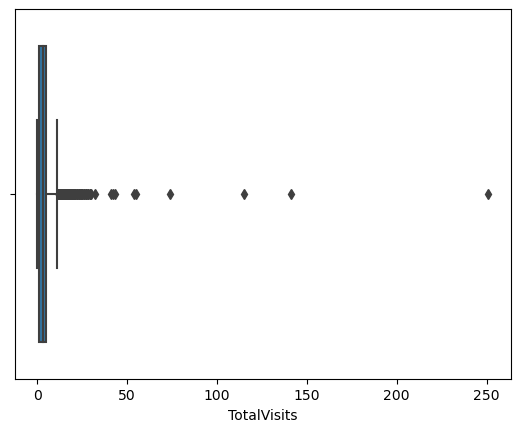

In [46]:
# Boxplot
sns.boxplot(x= "TotalVisits", data= df1)
plt.show()

In [47]:
# Describe the data
df1['TotalVisits'].describe(percentiles= [0.01, 0.05, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])

count    9103.000000
mean        3.445238
std         4.854853
min         0.000000
1%          0.000000
5%          0.000000
25%         1.000000
50%         3.000000
75%         5.000000
90%         7.000000
95%        10.000000
99%        17.000000
max       251.000000
Name: TotalVisits, dtype: float64

In [48]:
# Performing Capping and Flooring to treat outliers
# Capping
total_visit_ub = df1['TotalVisits'].quantile(0.95)
df1['TotalVisits'][df1['TotalVisits'] >= total_visit_ub] = total_visit_ub

# Flooring
total_visit_lb = df1['TotalVisits'].quantile(0.05)
df1['TotalVisits'][df1['TotalVisits'] <= total_visit_lb] = total_visit_lb

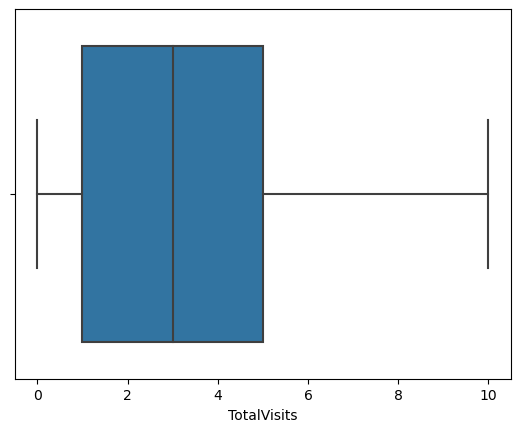

In [49]:
# Boxplot
sns.boxplot(x= "TotalVisits", data= df1)
plt.show()

**Col (2) - Total Time Spent on Website**

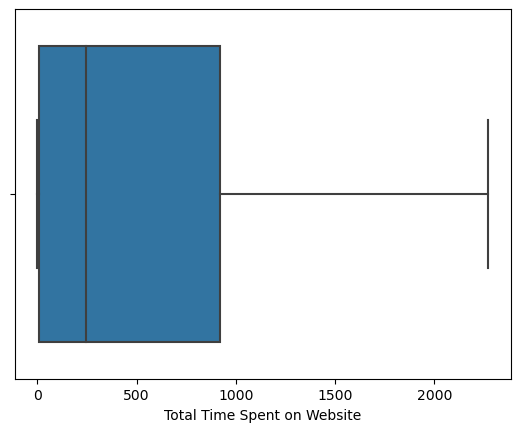

In [50]:
# Boxplot
sns.boxplot(x= "Total Time Spent on Website", data= df1)
plt.show()

* As there are no outlier/annomalies present in this variable, outlier treatment is not required.

**Col (3) - Page Views Per Visit**

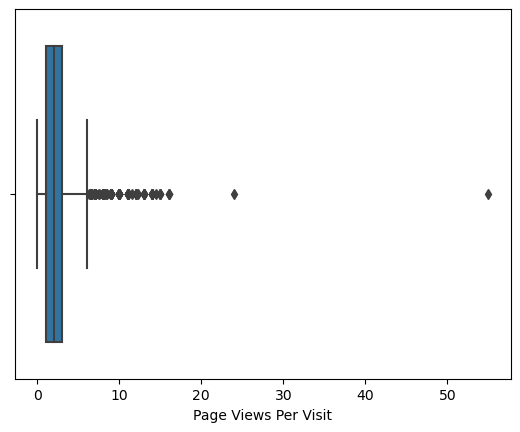

In [51]:
# Boxplot
sns.boxplot(x= 'Page Views Per Visit', data= df1)
plt.show()

In [52]:
# Describe the data
df1['Page Views Per Visit'].describe(percentiles= [0.01, 0.05, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])

count    9103.000000
mean        2.362820
std         2.161418
min         0.000000
1%          0.000000
5%          0.000000
25%         1.000000
50%         2.000000
75%         3.000000
90%         5.000000
95%         6.000000
99%         9.000000
max        55.000000
Name: Page Views Per Visit, dtype: float64

In [53]:
# Performing Capping and Flooring to treat outliers
# Capping
page_views_ub = df1['Page Views Per Visit'].quantile(0.95)
df1['Page Views Per Visit'][df1['Page Views Per Visit'] >= page_views_ub] = page_views_ub

# Flooring
page_views_lb = df1['Page Views Per Visit'].quantile(0.05)
df1['Page Views Per Visit'][df1['Page Views Per Visit'] <= page_views_lb] = page_views_lb

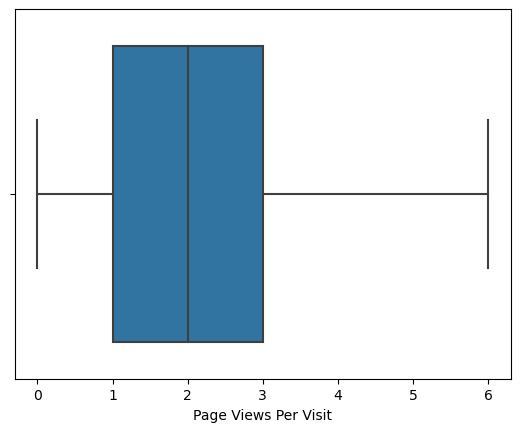

In [54]:
# Boxplot
sns.boxplot(x= 'Page Views Per Visit', data= df1)
plt.show()

In [55]:
# Dimensions of data
df1.shape

(9103, 22)

* **Outlier Detection & Treatment** has been completed.
* This summarizes **`DATA CLEANING`** stage.

#### <font color='darkgreen'>................ Step (2) : Data Cleaning Completed! ................<br>

<br>

### <font color='purple'>Step (3) : Exploratory Data Analysis<br>

### (3.1.1) : Univariate Analysis of Categorical Variables

In [56]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9103 entries, 0 to 9239
Data columns (total 22 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9103 non-null   object 
 1   Lead Source                                    9103 non-null   object 
 2   Do Not Email                                   9103 non-null   object 
 3   Do Not Call                                    9103 non-null   object 
 4   Converted                                      9103 non-null   int64  
 5   TotalVisits                                    9103 non-null   float64
 6   Total Time Spent on Website                    9103 non-null   int64  
 7   Page Views Per Visit                           9103 non-null   float64
 8   Last Activity                                  9103 non-null   object 
 9   Country                                        9103 

In [57]:
# Getting the list of categorical columns
cat_cols = df1.select_dtypes(include= "object").columns.to_list()
print(cat_cols)

['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call', 'Last Activity', 'Country', 'Specialization', 'What is your current occupation', 'What matters most to you in choosing a course', 'Search', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement', 'Through Recommendations', 'Tags', 'A free copy of Mastering The Interview', 'Last Notable Activity']


In [58]:
# Count of categorical columns
len(cat_cols)

18

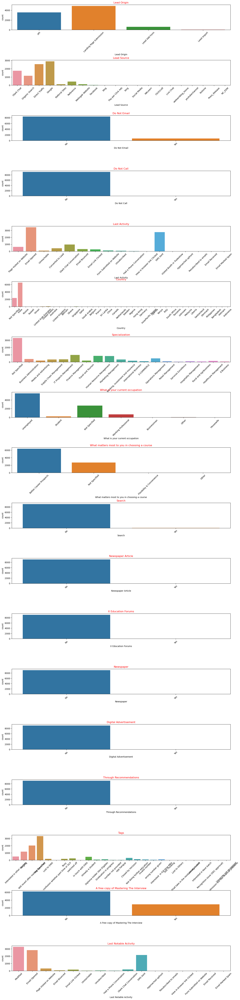

In [59]:
# Creating countplot for categorical columns

plt.figure(figsize= (18, 80))
for var in enumerate(cat_cols):
    plt.subplots_adjust(hspace= 1.2, wspace= 0.25)
    plt.subplot(18, 1, var[0]+1)
    sns.countplot(data= df1, x= var[1])
    plt.title(var[1], fontdict= {"fontsize" : 12, "fontweight" : 5, "color": "red"})
    plt.xticks(rotation = 45)

plt.show()

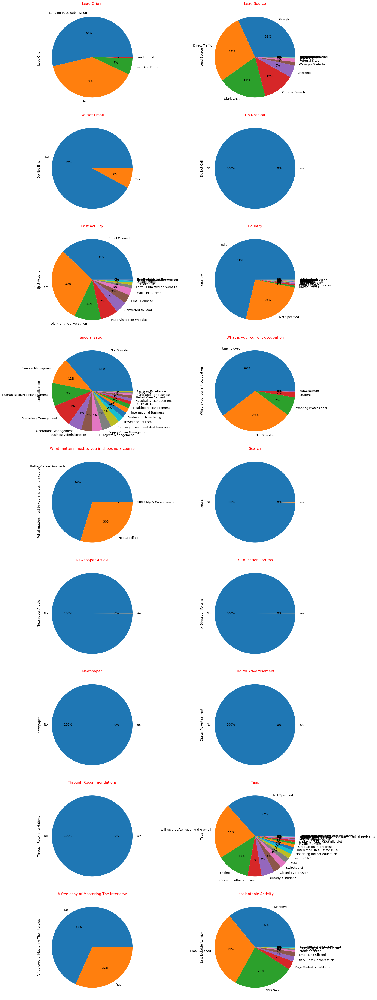

In [60]:
# Creating pie charts for categorical columns

plt.figure(figsize= (18, 60))
for var in enumerate(cat_cols):
    plt.subplots_adjust(hspace= 0.1)
    plt.subplot(9, 2, var[0]+1)
    df1[var[1]].value_counts(normalize=True).plot.pie(autopct="%1.0f%%")
    plt.title(var[1], fontdict= {"fontsize" : 12, "fontweight" : 5, "color": "red"})

plt.show()

**EDA - Categorical Variables Univariate Analysis Observations**

* Around **93%** of customers are leads generated from either **Landing Page Submission (54%)** or **API (39%)**.
* Approximately **80%** of the traffic is from **Google**, **Direct Traffic** or **Olark Chat**. 
* Most of the customers are ok with receiving **emails** or **calls**.
* Around **68%** of customer have recently **opened emails (38%)** or **have sent sms (30%)**.
* **71%** of the customers are from **India** and in **26%** of the cases, country name is missing.
* Around **60%** of the customers/students are **unemployed**.
* **70%** of the customers are looking for **Better Career Prospects**.
* Seems like customer have seen the ad or shown interest for program through some different sources as for listed sources the response is clearly **No**.
* **32%** of customers want a free copy of **Mastering The Interview**.

### (3.1.2) : Univariate Analysis of Numeric Variables

In [61]:
# Getting the list of numeric columns
num_cols = df1.select_dtypes(include= np.number).columns.to_list()
num_cols

['Converted',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit']

In [62]:
# Popping out Converted as it is a target column
num_cols.remove('Converted')
num_cols

['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']

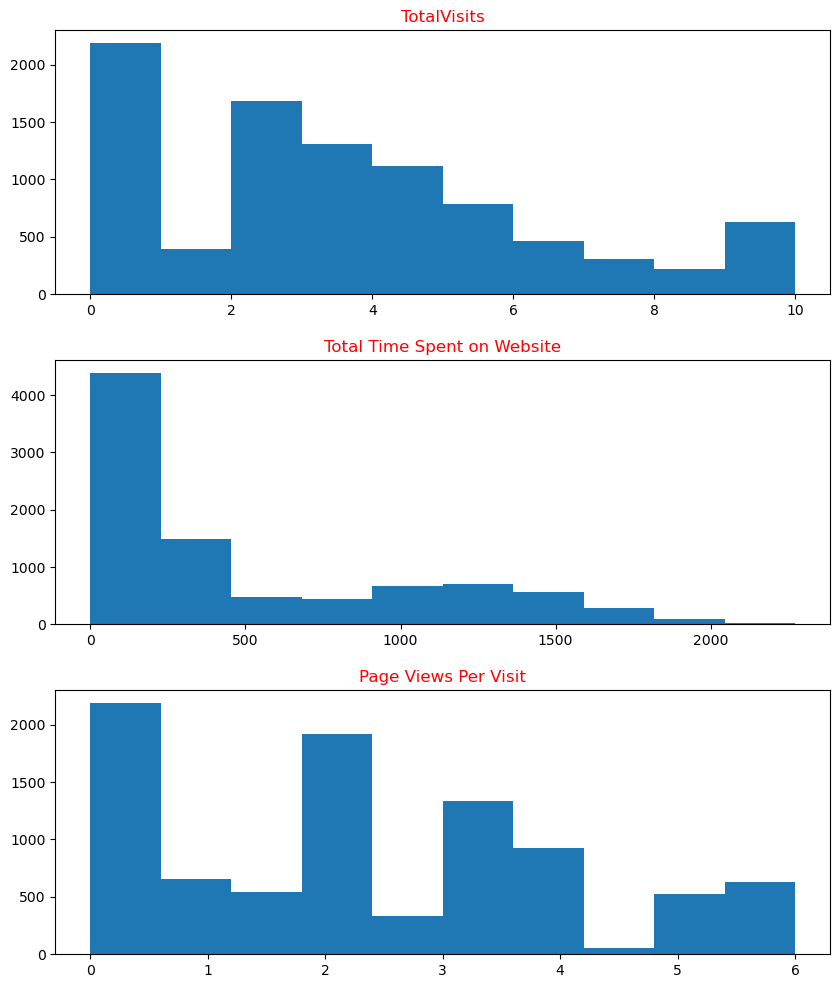

In [63]:
# Creating histograms to see distribution of numeric columns

plt.figure(figsize= (10, 12))
for var in enumerate(num_cols):
    plt.subplots_adjust(hspace= 0.25, wspace= 0.25)
    plt.subplot(3, 1, var[0]+1)
    plt.hist(data= df1, x= var[1])
    plt.title(var[1], fontdict= {"fontsize" : 12, "fontweight" : 5, "color": "red"})

plt.show()

<br>

### (3.2.1) : Bivariate Analysis of Numeric Variables

<Figure size 1000x1000 with 0 Axes>

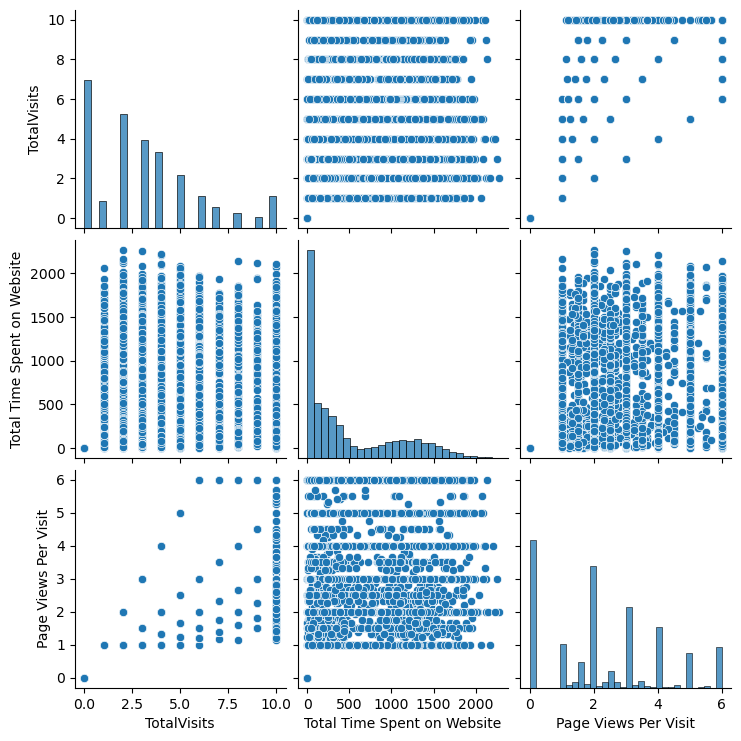

In [64]:
# Plotting the correlations
df2 = df1[num_cols]

# Pairplot
plt.figure(figsize= (10,10))
sns.pairplot(df2)
plt.show()

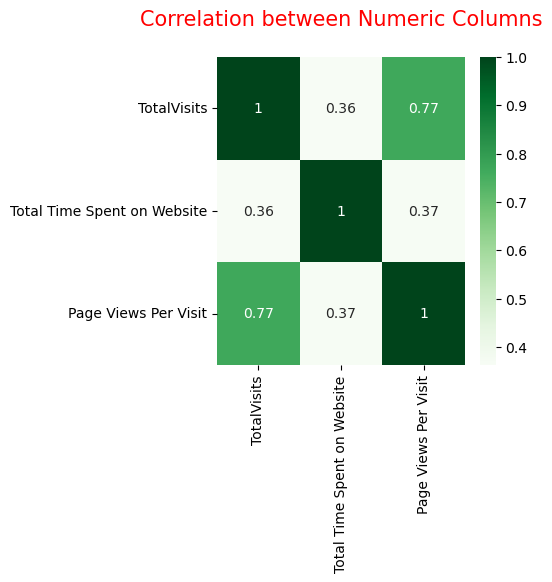

In [65]:
# Plotting the heatmap
plt.figure(figsize= (4,4))
sns.heatmap(df2.corr(), cmap= 'Greens', annot= True)
plt.title("Correlation between Numeric Columns\n", fontdict= {"fontsize" : 15, "fontweight" : 5, "color": "red"})
plt.show()

* **TotalVisits** and **Page Views Per Visit** have a correlation coefficient of **0.77**.

### (3.2.1) : Bivariate Analysis of Categorical Variables

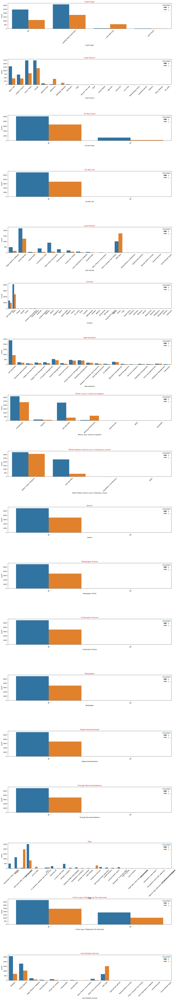

In [66]:
# Checking distribution of categorical variables with target variable 'Converted'

plt.figure(figsize= (20, 120))
for var in enumerate(cat_cols):
    plt.subplots_adjust(hspace= 1.2, wspace= 0.25)
    plt.subplot(18, 1, var[0]+1)
    sns.countplot(data= df1, x= var[1], hue= 'Converted')
    plt.title(var[1], fontdict= {"fontsize" : 12, "fontweight" : 5, "color": "red"})
    plt.xticks(rotation = 45)

plt.show()

**EDA - Categorical Variables Univariate Analysis Observations**

* **Lead Add Form** have better proportion of conversion, but the leads are low in number.
* **Reference** lead source has the highest chance of conversion. **Olark Chat** has more associated leads but comparatively less conversion probability.
* People who choose to get **emails** or **calls** have good conversion rate.
* **Sending Sms** to customers improves the chances of conversion.
* Customers from **India** have shown positive response.
* **Working professionals** have very good chance of conversion followed by **unemployed** people.
* People opting the course for **Better Career Prospects** have high chance of conversion.
* People who did not demand for free copy of **Mastering The Interview** have shown better conversion.
* **Sms Sent** have higher chances of conversion.

<br>

### (3.3) : Analysis of Target Variable

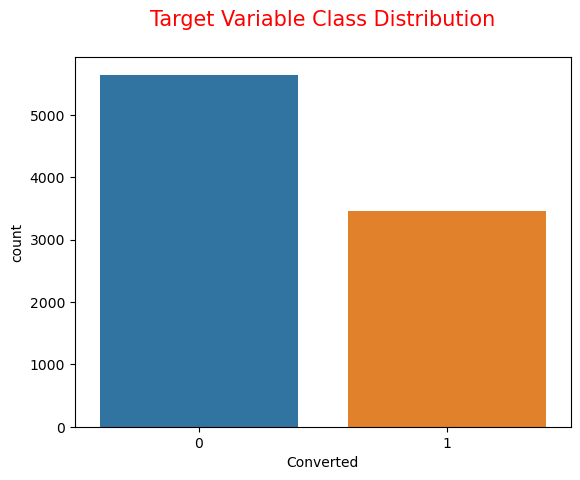

In [67]:
# Distribution
sns.countplot(data= df1, x= 'Converted')
plt.title("Target Variable Class Distribution\n", fontdict= {"fontsize" : 15, "fontweight" : 5, "color": "red"})
plt.show()

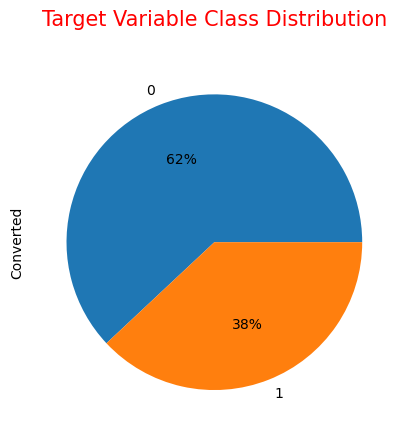

In [68]:
# Plotting a Pie Chart
df1['Converted'].value_counts(normalize=True).plot.pie(autopct="%1.0f%%")
plt.title("Target Variable Class Distribution\n", fontdict= {"fontsize" : 15, "fontweight" : 5, "color": "red"})
plt.show()

* Current Conversion Rate is **38%**.

In [69]:
# Plotting heatmap of numeric columns with 'Converted'
num_cols.extend(['Converted'])
num_cols

['TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit',
 'Converted']

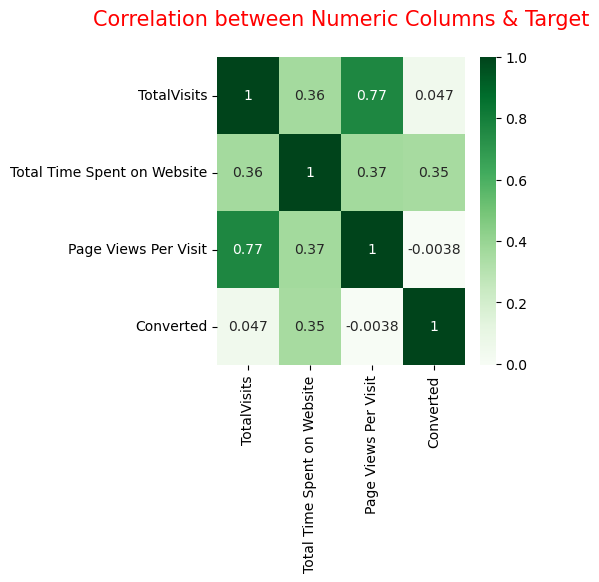

In [70]:
# Heatmap
df3 = df1[num_cols]

plt.figure(figsize= (4,4))
sns.heatmap(df3.corr(), cmap= 'Greens', annot= True)
plt.title("Correlation between Numeric Columns & Target\n", fontdict= {"fontsize" : 15, "fontweight" : 5, "color": "red"})
plt.show()

#### <font color='darkgreen'>................ Step (3) : EDA Completed! ................<br>

<br>

### <font color='purple'>Step (4) : Data Preparation<br>

In [71]:
# Checking the dimensions of Data
df1.shape

(9103, 22)

In [72]:
# Information about the dataset
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9103 entries, 0 to 9239
Data columns (total 22 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9103 non-null   object 
 1   Lead Source                                    9103 non-null   object 
 2   Do Not Email                                   9103 non-null   object 
 3   Do Not Call                                    9103 non-null   object 
 4   Converted                                      9103 non-null   int64  
 5   TotalVisits                                    9103 non-null   float64
 6   Total Time Spent on Website                    9103 non-null   int64  
 7   Page Views Per Visit                           9103 non-null   float64
 8   Last Activity                                  9103 non-null   object 
 9   Country                                        9103 

In [73]:
# From EDA step, we obserevd that below columns have very high imbalance i.e. extreme majority for 'No' class
high_imbalance_columns = ['Search', 'Newspaper Article', 'X Education Forums', 'Newspaper',
                         'Digital Advertisement', 'Through Recommendations']

for i in high_imbalance_columns:
    print("Distribution of",i,":\n",df1[i].value_counts(normalize= True))
    print()

Distribution of Search :
 No     0.998462
Yes    0.001538
Name: Search, dtype: float64

Distribution of Newspaper Article :
 No     0.99978
Yes    0.00022
Name: Newspaper Article, dtype: float64

Distribution of X Education Forums :
 No     0.99989
Yes    0.00011
Name: X Education Forums, dtype: float64

Distribution of Newspaper :
 No     0.99989
Yes    0.00011
Name: Newspaper, dtype: float64

Distribution of Digital Advertisement :
 No     0.999561
Yes    0.000439
Name: Digital Advertisement, dtype: float64

Distribution of Through Recommendations :
 No     0.999231
Yes    0.000769
Name: Through Recommendations, dtype: float64



In [74]:
# Thus, dropping these columns as they won't have any impact on target variable due to no variation.
df1.drop(columns= high_imbalance_columns, inplace= True)

In [75]:
# Checking the dataset
df1.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Tags,A free copy of Mastering The Interview,Last Notable Activity
0,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,Not Specified,Not Specified,Unemployed,Better Career Prospects,Interested in other courses,No,Modified
1,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Not Specified,Unemployed,Better Career Prospects,Ringing,No,Email Opened
2,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Student,Better Career Prospects,Will revert after reading the email,Yes,Email Opened
3,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Unemployed,Better Career Prospects,Ringing,No,Modified
4,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Not Specified,Unemployed,Better Career Prospects,Will revert after reading the email,No,Modified


In [76]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9103 entries, 0 to 9239
Data columns (total 16 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9103 non-null   object 
 1   Lead Source                                    9103 non-null   object 
 2   Do Not Email                                   9103 non-null   object 
 3   Do Not Call                                    9103 non-null   object 
 4   Converted                                      9103 non-null   int64  
 5   TotalVisits                                    9103 non-null   float64
 6   Total Time Spent on Website                    9103 non-null   int64  
 7   Page Views Per Visit                           9103 non-null   float64
 8   Last Activity                                  9103 non-null   object 
 9   Country                                        9103 

**Do Not Call**

In [77]:
# From EDA step, it can be seen that for 'Do Not Call' feature, the response is one sided.
df1['Do Not Call'].value_counts(normalize= True)

No     0.99978
Yes    0.00022
Name: Do Not Call, dtype: float64

In [78]:
# Hence, dropping the column 'Do Not Call'
df1.drop(columns= ['Do Not Call'], inplace= True)

**Country**

In [79]:
# Checking the distribution of Country Column
df1['Country'].value_counts(normalize= True)

India                   0.713171
Not Specified           0.255300
United States           0.007580
United Arab Emirates    0.005822
Singapore               0.002636
Saudi Arabia            0.002307
United Kingdom          0.001648
Australia               0.001428
Qatar                   0.001099
Bahrain                 0.000769
Hong Kong               0.000769
Oman                    0.000659
France                  0.000659
unknown                 0.000549
Kuwait                  0.000439
South Africa            0.000439
Canada                  0.000439
Nigeria                 0.000439
Germany                 0.000439
Sweden                  0.000330
Philippines             0.000220
Uganda                  0.000220
Italy                   0.000220
Bangladesh              0.000220
Netherlands             0.000220
Asia/Pacific Region     0.000220
China                   0.000220
Belgium                 0.000220
Ghana                   0.000220
Kenya                   0.000110
Sri Lanka 

In [80]:
# As fraction of India is the highest followed by Missing entries and then rest of the wold, creating 3 segments of columns.
def country(i):
    new_country = ""
    if i == "India":
        new_country = "India"
    elif i == "Not Specified":
        new_country = "Missing Entry"
    else:
        new_country = "Outside India"
    return new_country
        
# Replacing the values
df1['Country'] = df1.apply(lambda x: country(x['Country']), axis= 1)
# Checking distribution again
df1['Country'].value_counts(normalize= True)

India            0.713171
Missing Entry    0.255300
Outside India    0.031528
Name: Country, dtype: float64

In [81]:
# Also, 'Country' column has mostly 'India' as record or missing values (97%). Thus, dropping the column as it is not having any significant variation 
df1.drop(columns= ['Country'], inplace= True)

In [82]:
# Checking the latest info
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9103 entries, 0 to 9239
Data columns (total 14 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9103 non-null   object 
 1   Lead Source                                    9103 non-null   object 
 2   Do Not Email                                   9103 non-null   object 
 3   Converted                                      9103 non-null   int64  
 4   TotalVisits                                    9103 non-null   float64
 5   Total Time Spent on Website                    9103 non-null   int64  
 6   Page Views Per Visit                           9103 non-null   float64
 7   Last Activity                                  9103 non-null   object 
 8   Specialization                                 9103 non-null   object 
 9   What is your current occupation                9103 

In [83]:
# Getting the list of categorical columns
cat_cols_2 = df1.select_dtypes(include= "object").columns.to_list()
print(cat_cols_2)

['Lead Origin', 'Lead Source', 'Do Not Email', 'Last Activity', 'Specialization', 'What is your current occupation', 'What matters most to you in choosing a course', 'Tags', 'A free copy of Mastering The Interview', 'Last Notable Activity']


### **Creating Dummy Variables for Categorical Columns**

In [84]:
# Dummy vars Dataframe
dummy_df1 = pd.get_dummies(df1[cat_cols_2], drop_first= True)
dummy_df1.head()

,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,Lead Source_testone,...,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,A free copy of Mastering The Interview_Yes,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [85]:
# Concatenating the dummy dataframe with original dataframe
df_final = pd.concat([df1, dummy_df1], axis= 1)
df_final.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,What matters most to you in choosing a course,Tags,A free copy of Mastering The Interview,Last Notable Activity,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,...,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,A free copy of Mastering The Interview_Yes,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,API,Olark Chat,No,0,0.0,0,0.0,Page Visited on Website,Not Specified,Unemployed,Better Career Prospects,Interested in other courses,No,Modified,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,API,Organic Search,No,0,5.0,674,2.5,Email Opened,Not Specified,Unemployed,Better Career Prospects,Ringing,No,Email Opened,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,Landing Page Submission,Direct Traffic,No,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Better Career Prospects,Will revert after reading the email,Yes,Email Opened,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,Landing Page Submission,Direct Traffic,No,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Better Career Prospects,Ringing,No,Modified,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,Landing Page Submission,Google,No,1,2.0,1428,1.0,Converted to Lead,Not Specified,Unemployed,Better Career Prospects,Will revert after reading the email,No,Modified,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [86]:
# Dropping the original columns
df_final.drop(columns= cat_cols_2, inplace= True)
df_final.head()

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,...,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,A free copy of Mastering The Interview_Yes,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0,0.0,0,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,5.0,674,2.5,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,1,2.0,1532,2.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,1.0,305,1.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,1,2.0,1428,1.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


#### <font color='darkgreen'>................ Step (4) : Data Procesingg Completed! ................<br>

<br>

### <font color='purple'>Step (5) : Splitting the Data & Rescaling<br>

### (5.1) - Train Test Split

In [87]:
# Split the data into training and testing data
X = df_final.drop(columns= 'Converted')
X.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,...,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,A free copy of Mastering The Interview_Yes,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0.0,0,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,5.0,674,2.5,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,2.0,1532,2.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,1.0,305,1.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,2.0,1428,1.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [88]:
# Defining y
y = df_final['Converted']
y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [89]:
# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size= 0.7, random_state= 42)

### (5.2) - Feature Scaling

In [90]:
# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Transforming numeric variables
X_train[['TotalVisits', 'Page Views Per Visit', 'Total Time Spent on Website']] = scaler.fit_transform(X_train[['TotalVisits', 'Page Views Per Visit', 'Total Time Spent on Website']])
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,...,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,A free copy of Mastering The Interview_Yes,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
3360,0.3,0.518486,0.500000,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
436,0.3,0.020246,0.500000,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8236,0.6,0.305018,0.500000,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3034,0.1,0.548856,0.166667,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2776,0.2,0.030810,0.166667,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


### (5.3) - Looking at Correlations

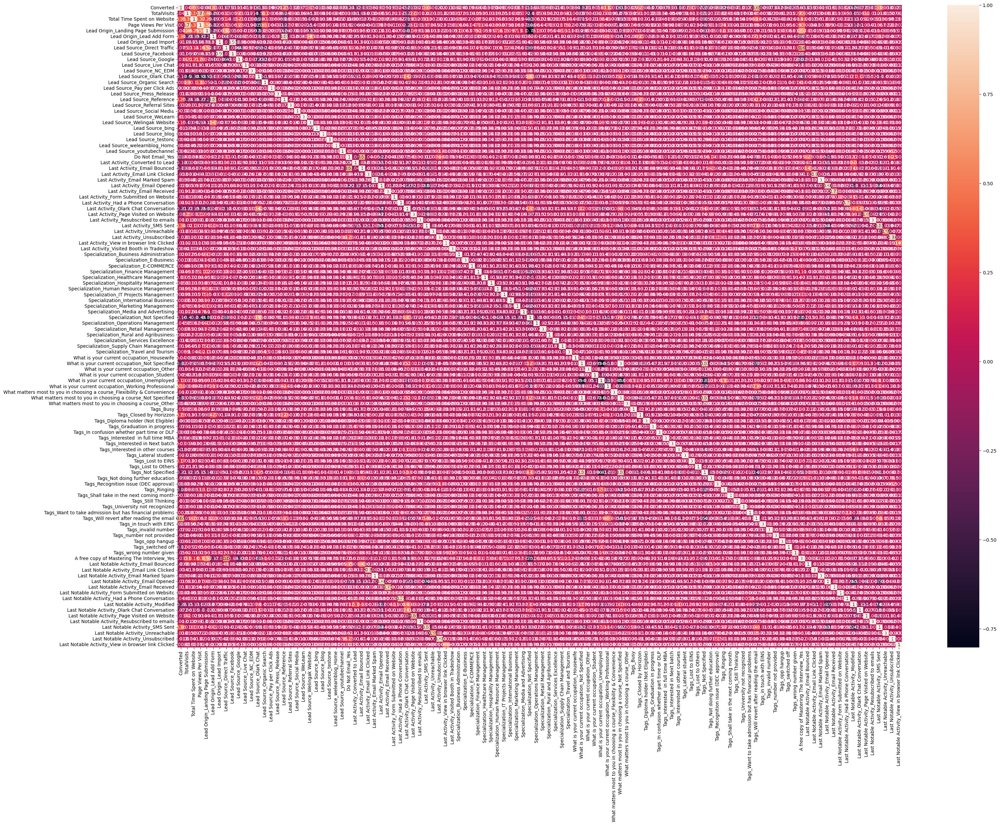

In [91]:
# Let's see the correlation matrix 
plt.figure(figsize = (35,25))
sns.heatmap(df_final.corr(), annot = True)
plt.show()

* Finding highly correlated columns is difficult due to the presence of large number of columns.
* Hence, proceeding to model building with **RFE**.

#### <font color='darkgreen'>................ Step (5) : Splitting and Rescaling Completed! ................<br>

<br>

### <font color='purple'>Step (6) : Model Building<br>

In [92]:
# Instantiate Logistic Regression
lr = LogisticRegression()

# Instantiate RFE with 20 features 
rfe = RFE(lr, n_features_to_select= 20)
rfe = rfe.fit(X_train, y_train)

In [93]:
# Checking rfe status
rfe.support_

array([False,  True,  True, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False,  True,  True,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False,  True,  True, False,
       False, False, False, False, False,  True,  True, False,  True,
       False, False,  True, False, False, False, False,  True, False,
        True, False, False,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False,  True, False])

In [94]:
# Columns selected by rfe
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('TotalVisits', False, 2),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', True, 1),
 ('Lead Origin_Landing Page Submission', False, 29),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', False, 45),
 ('Lead Source_Direct Traffic', False, 33),
 ('Lead Source_Facebook', False, 44),
 ('Lead Source_Google', False, 35),
 ('Lead Source_Live Chat', False, 84),
 ('Lead Source_NC_EDM', False, 15),
 ('Lead Source_Olark Chat', False, 6),
 ('Lead Source_Organic Search', False, 34),
 ('Lead Source_Pay per Click Ads', False, 86),
 ('Lead Source_Press_Release', False, 74),
 ('Lead Source_Reference', False, 75),
 ('Lead Source_Referral Sites', False, 32),
 ('Lead Source_Social Media', False, 64),
 ('Lead Source_WeLearn', False, 80),
 ('Lead Source_Welingak Website', True, 1),
 ('Lead Source_bing', False, 82),
 ('Lead Source_blog', False, 53),
 ('Lead Source_testone', False, 78),
 ('Lead Source_welearnblog_Home', False, 63),
 ('Lead Source_youtubechannel', Fal

In [95]:
col = X_train.columns[rfe.support_]
col

Index(['Total Time Spent on Website', 'Page Views Per Visit',
       'Lead Origin_Lead Add Form', 'Lead Source_Welingak Website',
       'Do Not Email_Yes', 'Last Activity_Converted to Lead',
       'Last Activity_Olark Chat Conversation',
       'What matters most to you in choosing a course_Not Specified',
       'Tags_Busy', 'Tags_Closed by Horizzon', 'Tags_Lateral student',
       'Tags_Lost to EINS', 'Tags_Not Specified', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_switched off', 'Tags_wrong number given',
       'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed'],
      dtype='object')

##### Assessing the model with StatsModels

In [96]:
# Creating user defined function for statsmodel approach

def glm_model(rfe_cols):
    X_train_sm = sm.add_constant(X_train[rfe_cols])
    lr = sm.GLM(y_train, X_train_sm, family= sm.families.Binomial()).fit()
    print(lr.summary())
    return lr

In [97]:
# Creating user defined function for calculating VIF

def vif_data(rfe_cols):
    vif = pd.DataFrame()
    X_vif = X_train[rfe_cols]
    vif['Features'] = X_vif.columns
    vif["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by= "VIF", ascending= False)
    print(vif)

<br>

#### Model (1) : Using features selected by RFE 

In [98]:
# Applying GLM & VIF functions

# GLM function
glm_model(col)
print()
# VIF function
vif_data(col)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6351
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1089.5
Date:                Mon, 16 Oct 2023   Deviance:                       2178.9
Time:                        11:55:19   Pearson chi2:                 9.82e+03
No. Iterations:                    24   Pseudo R-squ. (CS):             0.6277
Covariance Type:            nonrobust                                         
                                                                  coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------

* **Tags_Lateral student** has the highest unacceptable p_value of **1.000**. Hence, dropping the column.

#### Model (2)

In [99]:
# Dropping column 'Tags_Lateral studenr'
rfe_cols = list(col)
rfe_cols.remove("Tags_Lateral student")
print(rfe_cols)

['Total Time Spent on Website', 'Page Views Per Visit', 'Lead Origin_Lead Add Form', 'Lead Source_Welingak Website', 'Do Not Email_Yes', 'Last Activity_Converted to Lead', 'Last Activity_Olark Chat Conversation', 'What matters most to you in choosing a course_Not Specified', 'Tags_Busy', 'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Not Specified', 'Tags_Ringing', 'Tags_Will revert after reading the email', 'Tags_invalid number', 'Tags_switched off', 'Tags_wrong number given', 'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed']


In [100]:
# GLM function
glm_model(rfe_cols)
print()
# VIF function
vif_data(rfe_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6352
Model Family:                Binomial   Df Model:                           19
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1094.4
Date:                Mon, 16 Oct 2023   Deviance:                       2188.7
Time:                        11:55:20   Pearson chi2:                 9.81e+03
No. Iterations:                    23   Pseudo R-squ. (CS):             0.6271
Covariance Type:            nonrobust                                         
                                                                  coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------

* **Tags_wrong number given** has the highest unacceptable p_value of **0.999**. Hence, dropping the column.

#### Model (3)

In [101]:
# Dropping column 'Tags_wrong number given'
rfe_cols.remove('Tags_wrong number given')
print(rfe_cols)

['Total Time Spent on Website', 'Page Views Per Visit', 'Lead Origin_Lead Add Form', 'Lead Source_Welingak Website', 'Do Not Email_Yes', 'Last Activity_Converted to Lead', 'Last Activity_Olark Chat Conversation', 'What matters most to you in choosing a course_Not Specified', 'Tags_Busy', 'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Not Specified', 'Tags_Ringing', 'Tags_Will revert after reading the email', 'Tags_invalid number', 'Tags_switched off', 'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed']


In [102]:
# GLM function
glm_model(rfe_cols)
print()
# VIF function
vif_data(rfe_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6353
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1097.0
Date:                Mon, 16 Oct 2023   Deviance:                       2194.0
Time:                        11:55:20   Pearson chi2:                 9.75e+03
No. Iterations:                    23   Pseudo R-squ. (CS):             0.6268
Covariance Type:            nonrobust                                         
                                                                  coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------

* **Tags_invalid number** has the highest unacceptable p_value of **0.999**. Hence, dropping the column.

#### Model (4)

In [103]:
# Dropping column 'Tags_invalid number'
rfe_cols.remove('Tags_invalid number')
print(rfe_cols)

['Total Time Spent on Website', 'Page Views Per Visit', 'Lead Origin_Lead Add Form', 'Lead Source_Welingak Website', 'Do Not Email_Yes', 'Last Activity_Converted to Lead', 'Last Activity_Olark Chat Conversation', 'What matters most to you in choosing a course_Not Specified', 'Tags_Busy', 'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Not Specified', 'Tags_Ringing', 'Tags_Will revert after reading the email', 'Tags_switched off', 'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed']


In [104]:
# GLM function
glm_model(rfe_cols)
print()
# VIF function
vif_data(rfe_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6354
Model Family:                Binomial   Df Model:                           17
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1103.2
Date:                Mon, 16 Oct 2023   Deviance:                       2206.3
Time:                        11:55:20   Pearson chi2:                 9.60e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.6261
Covariance Type:            nonrobust                                         
                                                                  coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------

* **Lead Origin_Lead Add Form** has the highest unaccepted p value of **0.051**. Hence dropping the column. 

#### Model (5)

In [105]:
# Dropping column 'Lead Origin_Lead Add Form
rfe_cols.remove('Lead Origin_Lead Add Form')
print(rfe_cols)

['Total Time Spent on Website', 'Page Views Per Visit', 'Lead Source_Welingak Website', 'Do Not Email_Yes', 'Last Activity_Converted to Lead', 'Last Activity_Olark Chat Conversation', 'What matters most to you in choosing a course_Not Specified', 'Tags_Busy', 'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Not Specified', 'Tags_Ringing', 'Tags_Will revert after reading the email', 'Tags_switched off', 'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed']


In [106]:
# GLM function
glm_model(rfe_cols)
print()
# VIF function
vif_data(rfe_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6355
Model Family:                Binomial   Df Model:                           16
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1105.3
Date:                Mon, 16 Oct 2023   Deviance:                       2210.5
Time:                        11:55:20   Pearson chi2:                 9.72e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.6259
Covariance Type:            nonrobust                                         
                                                                  coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------

* **Tags_Not Specified** has high unacceptable VIF value of **5.29**. Hence dropping the column.

#### Model (6)

In [107]:
# Dropping column 'Tags_Not Specified'
rfe_cols.remove('Tags_Not Specified')
print(rfe_cols)

['Total Time Spent on Website', 'Page Views Per Visit', 'Lead Source_Welingak Website', 'Do Not Email_Yes', 'Last Activity_Converted to Lead', 'Last Activity_Olark Chat Conversation', 'What matters most to you in choosing a course_Not Specified', 'Tags_Busy', 'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Ringing', 'Tags_Will revert after reading the email', 'Tags_switched off', 'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed']


In [108]:
# GLM function
glm_model(rfe_cols)
print()
# VIF function
vif_data(rfe_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6356
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1320.8
Date:                Mon, 16 Oct 2023   Deviance:                       2641.6
Time:                        11:55:21   Pearson chi2:                 1.01e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5997
Covariance Type:            nonrobust                                         
                                                                  coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------

* **Tags_Busy** has the highest unaccepted p value of **0.072**. Hence dropping the column.

#### Model (7)

In [109]:
# Dropping column 'Tags_Busy'
rfe_cols.remove('Tags_Busy')
print(rfe_cols)

['Total Time Spent on Website', 'Page Views Per Visit', 'Lead Source_Welingak Website', 'Do Not Email_Yes', 'Last Activity_Converted to Lead', 'Last Activity_Olark Chat Conversation', 'What matters most to you in choosing a course_Not Specified', 'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Ringing', 'Tags_Will revert after reading the email', 'Tags_switched off', 'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed']


In [110]:
# GLM function
glm_model(rfe_cols)
print()
# VIF function
vif_data(rfe_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6357
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1322.4
Date:                Mon, 16 Oct 2023   Deviance:                       2644.8
Time:                        11:55:21   Pearson chi2:                 1.04e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5995
Covariance Type:            nonrobust                                         
                                                                  coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------

* p-values for all columns are in acceptable limit i.e. less than 0.05.
* The VIF values are also in acceptable limits i.e. less than 5.
* Thus, selecting this model for further processing. 

### Model Prediction

In [111]:
# Defining X_train with final columns
X_train = X_train[rfe_cols]
X_train.head()

,Total Time Spent on Website,Page Views Per Visit,Lead Source_Welingak Website,Do Not Email_Yes,Last Activity_Converted to Lead,Last Activity_Olark Chat Conversation,What matters most to you in choosing a course_Not Specified,Tags_Closed by Horizzon,Tags_Lost to EINS,Tags_Ringing,Tags_Will revert after reading the email,Tags_switched off,Last Notable Activity_SMS Sent,Last Notable Activity_Unsubscribed
3360,0.518486,0.500000,0,0,0,0,1,0,0,0,0,0,1,0
436,0.020246,0.500000,0,0,0,0,0,0,0,0,0,0,0,0
8236,0.305018,0.500000,0,0,0,0,1,0,0,0,0,0,0,0
3034,0.548856,0.166667,0,0,0,0,0,0,1,0,0,0,0,0
2776,0.030810,0.166667,0,0,0,0,0,0,0,0,0,0,0,0


In [112]:
# Dimensions of new train data
X_train.shape

(6372, 14)

In [113]:
# Making the prediction on training dataset

# Adding constant
X_train_sm = sm.add_constant(X_train)

# Prediction on training dataset
lr2 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = lr2.fit()

In [114]:
# Predicting on training data
y_train_pred = res.predict(X_train_sm)
y_train_pred

3360    0.795690
436     0.074038
8236    0.099752
3034    0.996701
2776    0.126104
          ...   
5828    0.110385
5282    0.152306
5482    0.122711
897     0.079919
7390    0.073016
Length: 6372, dtype: float64

In [115]:
# Reshaping
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred

array([0.79569014, 0.07403846, 0.09975247, ..., 0.12271134, 0.07991876,
       0.07301631])

##### Creating a dataframe with the actual churn flag and the predicted probabilities

In [116]:
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Conversion_Prob':y_train_pred})
y_train_pred_final.head()

,Converted,Conversion_Prob
0,1,0.795690
1,0,0.074038
2,0,0.099752
3,1,0.996701
4,0,0.126104


In [117]:
# Assuming the initial probability of 0.5 as cut off probability
y_train_pred_final['Predicted'] = y_train_pred_final['Conversion_Prob'].map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head(10)

,Converted,Conversion_Prob,Predicted
0,1,0.795690,1
1,0,0.074038,0
2,0,0.099752,0
3,1,0.996701,1
4,0,0.126104,0
5,1,0.987485,1
6,0,0.001549,0
7,1,0.034412,0
8,0,0.380395,0
9,1,0.875159,1


#### <font color='darkgreen'>................ Step (6) : Model Selection Completed! ................<br>

<br>

### <font color='purple'>Step (7) : Model Evaluation<br>

In [118]:
# Creating confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['Predicted'] )
confusion

array([[3771,  167],
       [ 316, 2118]], dtype=int64)

In [119]:
# Check the model accuracy
metrics.accuracy_score(y_train_pred_final['Converted'], y_train_pred_final['Predicted'])

0.9241996233521658

#### Evaluation using Metrics beyond Accuracy

In [120]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [121]:
# Sensitivity
print("Sensitivity of model is: ",TP/float(TP+FN))

Sensitivity of model is:  0.8701725554642563


In [122]:
# Specificity
print("Specificity of model is: ",TN/float(TN+FP))

Specificity of model is:  0.9575926866429659


In [123]:
# False Positive Rate
print("False Positive Rate of model is: ",FP/ float(TN+FP))

False Positive Rate of model is:  0.04240731335703403


In [124]:
# Positive Predictive Value
print("Positive Predictive Value of model is: ",TP/ float(TP+FP))

Positive Predictive Value of model is:  0.9269146608315099


In [125]:
# Negative Predictive Value
print("Negative Predictive Value of model is: ",TN/ float(TN+FN))

Negative Predictive Value of model is:  0.922681673599217


#### <font color='darkgreen'>................ Step (7) : Initial Model Evaluation Completed! ................<br>

<br>

### <font color='purple'>Step (8) : Plotting ROC Curve<br>

* Plotting the **ROC Curve** tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).

In [126]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [127]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final['Converted'], y_train_pred_final['Conversion_Prob'], drop_intermediate = False )

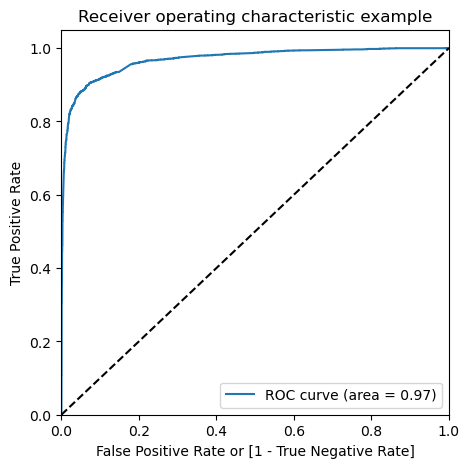

In [128]:
# Plotting the ROC Curve
draw_roc(y_train_pred_final['Converted'], y_train_pred_final['Conversion_Prob'])

#### <font color='darkgreen'>................ Step (8) : ROC Curve plotting Completed! ................<br>

<br>

### <font color='purple'>Step (9) : Finding Optimal Cut Off Point<br>
    
* **Optimal cutoff** probability is that prob where we get balanced sensitivity and specificity

In [129]:
# Creating dataframe with different probability cut offs
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final['Conversion_Prob'].map(lambda x: 1 if x > i else 0)
# print the data
y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.795690,1,1,1,1,1,1,1,1,1,0,0
1,0,0.074038,0,1,0,0,0,0,0,0,0,0,0
2,0,0.099752,0,1,0,0,0,0,0,0,0,0,0
3,1,0.996701,1,1,1,1,1,1,1,1,1,1,1
4,0,0.126104,0,1,1,0,0,0,0,0,0,0,0


In [130]:
# Calculating accuracy, sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['Prob','Accuracy','Sensi','Speci'])

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
    
print(cutoff_df)

     Prob  Accuracy     Sensi     Speci
0.0   0.0  0.381984  1.000000  0.000000
0.1   0.1  0.838669  0.966721  0.759523
0.2   0.2  0.902542  0.921118  0.891061
0.3   0.3  0.916981  0.906327  0.923565
0.4   0.4  0.920904  0.884552  0.943372
0.5   0.5  0.924200  0.870173  0.957593
0.6   0.6  0.922473  0.842646  0.971813
0.7   0.7  0.918550  0.820460  0.979177
0.8   0.8  0.905367  0.778554  0.983748
0.9   0.9  0.890458  0.730074  0.989589


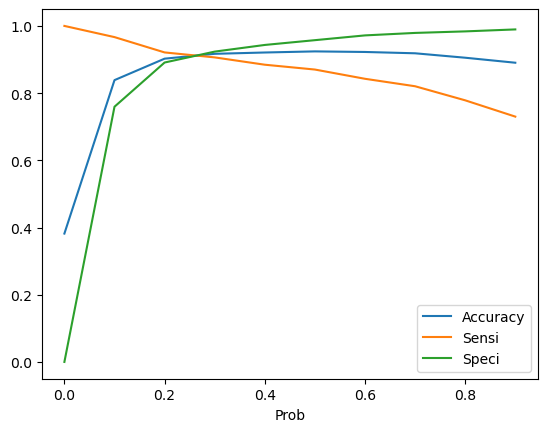

In [131]:
# Plotting accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='Prob', y=['Accuracy','Sensi','Speci'])
plt.show()

#### From above ROC Curve, taking **0.3** as optimum point as cutoff probability.

In [132]:
# Making final prediction

y_train_pred_final['Final_Predicted'] = y_train_pred_final['Conversion_Prob'].map( lambda x: 1 if x > 0.3 else 0)
y_train_pred_final.head(10)

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,Final_Predicted
0,1,0.795690,1,1,1,1,1,1,1,1,1,0,0,1
1,0,0.074038,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.099752,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0.996701,1,1,1,1,1,1,1,1,1,1,1,1
4,0,0.126104,0,1,1,0,0,0,0,0,0,0,0,0
5,1,0.987485,1,1,1,1,1,1,1,1,1,1,1,1
6,0,0.001549,0,1,0,0,0,0,0,0,0,0,0,0
7,1,0.034412,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0.380395,0,1,1,1,1,0,0,0,0,0,0,1
9,1,0.875159,1,1,1,1,1,1,1,1,1,1,0,1


In [133]:
# Checking the accuracy of model
metrics.accuracy_score(y_train_pred_final['Converted'], y_train_pred_final['Final_Predicted'])

0.9169805398618958

In [134]:
# Confusion matrix
confusion2 = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['Final_Predicted'])
confusion2

array([[3637,  301],
       [ 228, 2206]], dtype=int64)

In [135]:
# Parameters for calculating other metrics
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [136]:
# Sensitivity
print("Sensitivity of model is: ",TP/float(TP+FN))

Sensitivity of model is:  0.9063270336894002


In [137]:
# Specificity
print("Specificity of model is: ",TN/float(TN+FP))

Specificity of model is:  0.9235652615540884


In [138]:
# False Positive Rate
print("False Positive Rate of model is: ",FP/ float(TN+FP))

False Positive Rate of model is:  0.07643473844591163


In [139]:
# Positive Predictive Value
print("Positive Predictive Value of model is: ",TP/ float(TP+FP))

Positive Predictive Value of model is:  0.879936178699641


In [140]:
# Negative Predictive Value
print("Negative Predictive Value of model is: ",TN/ float(TN+FN))

Negative Predictive Value of model is:  0.9410090556274257


### For Training Dataset:
<br>

* Model Accuracy : **91.7%**
* Model Sensitivity : **90.63%**
* Model Specificity : **92.36%**
* Model False Positive Rate : **7.64%**
* Model Positive Predictive Value : **87.99%**
* Model Negative Predictive Value : **94.1%**

#### <font color='darkgreen'>................ Step (9) : Training Data Evaluation Completed! ................<br>

<br>

### <font color='purple'>Step (10) : Predictions on Test Data<br>

In [141]:
# Scaling numeric values
X_test[['TotalVisits', 'Page Views Per Visit', 'Total Time Spent on Website']] = scaler.transform(X_test[['TotalVisits', 'Page Views Per Visit', 'Total Time Spent on Website']])

In [142]:
# Selecting only final columns for test data
X_test= X_test[rfe_cols]

In [143]:
# Adding constant to X_test
X_test_sm = sm.add_constant(X_test)
X_test_sm.head()

,const,Total Time Spent on Website,Page Views Per Visit,Lead Source_Welingak Website,Do Not Email_Yes,Last Activity_Converted to Lead,Last Activity_Olark Chat Conversation,What matters most to you in choosing a course_Not Specified,Tags_Closed by Horizzon,Tags_Lost to EINS,Tags_Ringing,Tags_Will revert after reading the email,Tags_switched off,Last Notable Activity_SMS Sent,Last Notable Activity_Unsubscribed
7999,1.0,0.093310,0.166667,0,0,1,0,0,0,0,0,0,0,0,0
4317,1.0,0.056338,0.500000,0,0,0,0,0,0,0,0,1,0,0,0
5468,1.0,0.000000,0.000000,0,0,0,1,1,0,0,0,0,0,0,0
2220,1.0,0.196743,0.333333,0,0,0,0,0,0,0,0,0,0,0,0
3766,1.0,0.045335,0.666667,0,0,0,0,1,0,0,0,0,0,0,0


In [144]:
# Predicting test data
y_test_pred = res.predict(X_test_sm)

In [145]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)
y_pred_1.head()

,0
7999,0.020588
4317,0.907794
5468,0.022234
2220,0.171308
3766,0.030239


In [146]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [147]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [148]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)
y_pred_final.head()

,Converted,0
0,0,0.020588
1,1,0.907794
2,0,0.022234
3,0,0.171308
4,0,0.030239


In [149]:
# Renaming the column
y_pred_final.rename(columns= {0 : 'Conversion_Prob'}, inplace= True)
y_pred_final.head()

,Converted,Conversion_Prob
0,0,0.020588
1,1,0.907794
2,0,0.022234
3,0,0.171308
4,0,0.030239


In [150]:
# Making prediction using cut off 0.37
y_pred_final['Final_Predicted'] = y_pred_final['Conversion_Prob'].map(lambda x: 1 if x > 0.3 else 0)
y_pred_final.head(10)

,Converted,Conversion_Prob,Final_Predicted
0,0,0.020588,0
1,1,0.907794,1
2,0,0.022234,0
3,0,0.171308,0
4,0,0.030239,0
5,0,0.046484,0
6,1,0.996459,1
7,0,0.008077,0
8,1,0.109815,0
9,1,0.996550,1


In [151]:
# Checking model accuracy
metrics.accuracy_score(y_pred_final['Converted'], y_pred_final['Final_Predicted'])

0.9132186012449652

In [152]:
# Confusion matrix
confusion3 = metrics.confusion_matrix(y_pred_final['Converted'], y_pred_final['Final_Predicted'] )
confusion3

array([[1570,  134],
       [ 103,  924]], dtype=int64)

In [153]:
# Parameters for calculating other metrics
TP = confusion3[1,1] # true positive 
TN = confusion3[0,0] # true negatives
FP = confusion3[0,1] # false positives
FN = confusion3[1,0] # false negatives

In [154]:
# Sensitivity
print("Sensitivity of test data is: ",TP/float(TP+FN))

Sensitivity of test data is:  0.8997078870496592


In [155]:
# Specificity
print("Specificity of test data is: ",TN/float(TN+FP))

Specificity of test data is:  0.9213615023474179


In [156]:
# False Positive Rate
print("False Positive Rate of test data is: ",FP/ float(TN+FP))

False Positive Rate of test data is:  0.07863849765258216


In [157]:
# Positive Predictive Value
print("Positive Predictive Value of test data is: ",TP/ float(TP+FP))

Positive Predictive Value of test data is:  0.8733459357277883


In [158]:
# Negative Predictive Value
print("Negative Predictive Value of test data is: ",TN/ float(TN+FN))

Negative Predictive Value of test data is:  0.9384339509862523


### For Training Dataset:
<br>

* Model Accuracy : **91.7%**
* Model Sensitivity : **90.63%**
* Model Specificity : **92.36%**
* Model False Positive Rate : **7.64%**
* Model Positive Predictive Value : **87.99%**
* Model Negative Predictive Value : **94.1%**

### For Testing Dataset:
<br>

* Model Accuracy : **91.32%**
* Model Sensitivity : **89.98%**
* Model Specificity : **92.14%**
* Model False Positive Rate : **7.86%**
* Model Positive Predictive Value : **87.33%**
* Model Negative Predictive Value : **93.84%**

#### <font color='darkgreen'>................ Step (10) : Testing Data Prediction Completed! ................<br>

<br>

### <font color='purple'>Step (11) : Precision & Recall<br>

In [159]:
# Calculating the precision score
precision_score(y_train_pred_final['Converted'], y_train_pred_final['Final_Predicted'])

0.879936178699641

In [160]:
# Recall Score
recall_score(y_train_pred_final['Converted'], y_train_pred_final['Final_Predicted'])

0.9063270336894002

In [161]:
# Plotting the confusion matrix
confusion4 =  metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['Final_Predicted'])
confusion4

array([[3637,  301],
       [ 228, 2206]], dtype=int64)

In [162]:
# Parameters for calculating other metrics
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [163]:
# Precision
print("Precision value is :",TP/float(TP+FP))

Precision value is : 0.9269146608315099


In [164]:
# Recall
print("Recall score is :",TP/float(TP+FN))

Recall score is : 0.8701725554642563


### Precision-Recall Trade off

In [165]:
p, r, thresholds = precision_recall_curve(y_train_pred_final['Converted'], y_train_pred_final['Conversion_Prob'])

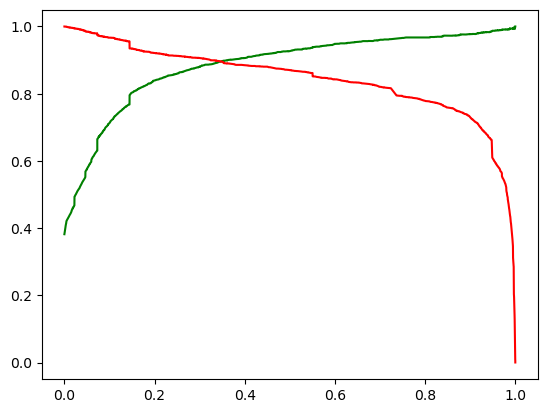

In [166]:
# Plotting the curve
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

#### From above curve, taking **0.37** as optimum point.

In [167]:
y_train_pred_final['Final_Predicted_2'] = y_train_pred_final['Conversion_Prob'].map(lambda x: 1 if x > 0.37 else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,Final_Predicted,Final_Predicted_2
0,1,0.795690,1,1,1,1,1,1,1,1,1,0,0,1,1
1,0,0.074038,0,1,0,0,0,0,0,0,0,0,0,0,0
2,0,0.099752,0,1,0,0,0,0,0,0,0,0,0,0,0
3,1,0.996701,1,1,1,1,1,1,1,1,1,1,1,1,1
4,0,0.126104,0,1,1,0,0,0,0,0,0,0,0,0,0


In [168]:
# Accuracy
print("Accuracy of model :",metrics.accuracy_score(y_train_pred_final['Converted'], y_train_pred_final['Final_Predicted_2']))

Accuracy of model : 0.9202762084118016


In [169]:
# Creating confusion matrix
confusion5 = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['Final_Predicted_2'])
confusion5

array([[3701,  237],
       [ 271, 2163]], dtype=int64)

In [170]:
# Parameters for calculating other metrics
TP = confusion5[1,1] # true positive 
TN = confusion5[0,0] # true negatives
FP = confusion5[0,1] # false positives
FN = confusion5[1,0] # false negatives

In [171]:
# Precision
print("Precision of final model :",TP/float(TP+FP))

Precision of final model : 0.90125


In [172]:
# Recall
print("Recall of final model :",TP/float(TP+FN))

Recall of final model : 0.8886606409202958


### Test Data Prediction

In [173]:
# Making prediction using cut off 0.37
y_pred_final['Final_Predicted_2'] = y_pred_final['Conversion_Prob'].map(lambda x: 1 if x > 0.41 else 0)
y_pred_final.head(10)

,Converted,Conversion_Prob,Final_Predicted,Final_Predicted_2
0,0,0.020588,0,0
1,1,0.907794,1,1
2,0,0.022234,0,0
3,0,0.171308,0,0
4,0,0.030239,0,0
5,0,0.046484,0,0
6,1,0.996459,1,1
7,0,0.008077,0,0
8,1,0.109815,0,0
9,1,0.996550,1,1


In [174]:
# Accuracy
print("Accuracy of model :",metrics.accuracy_score(y_pred_final['Converted'], y_pred_final['Final_Predicted_2']))

Accuracy of model : 0.9154155986818016


In [175]:
# Creating confusion matrix 
confusion6 = metrics.confusion_matrix(y_pred_final['Converted'], y_pred_final['Final_Predicted_2'])
confusion6

array([[1604,  100],
       [ 131,  896]], dtype=int64)

In [176]:
# Parameters for calculating other metrics
TP = confusion6[1,1] # true positive 
TN = confusion6[0,0] # true negatives
FP = confusion6[0,1] # false positives
FN = confusion6[1,0] # false negatives

In [177]:
# Precision
print("Precision of final model :",TP/float(TP+FP))

Precision of final model : 0.8995983935742972


In [178]:
# Recall
print("Recall of final model :",TP/float(TP+FN))

Recall of final model : 0.872444011684518


### With Precsion - Recall Method having cut off as 0.41:<br>

### For Training Dataset:
* Model Accuracy : **92.03%**
* Model Precision : **90.13%**
* Model Recall : **88.87**
<br>

### For Testing Dataset:
* Model Accuracy : **91.54%**
* Model Precision : **89.96**
* Model Recall : **87.24**

#### <font color='darkgreen'>................ Step (11) : Precision & Recall method Completed! ................<br>

<br>

### <font color='purple'>Step (12) : Conclusion, Results and Recommendations<br>

### Results of ML Model:
<br>

### For Training Dataset:

* Model Accuracy : **91.7%**
* Model Sensitivity : **90.63%**
* Model Specificity : **92.36%**
* Model False Positive Rate : **7.64%**
* Model Positive Predictive Value : **87.99%**
* Model Negative Predictive Value : **94.1%**
<br>

### For Testing Dataset:

* Model Accuracy : **91.32%**
* Model Sensitivity : **89.98%**
* Model Specificity : **92.14%**
* Model False Positive Rate : **7.86%**
* Model Positive Predictive Value : **87.33%**
* Model Negative Predictive Value : **93.84%**

### Recommendations:

**The factors which are important in deciding the Conversion Rate are:**

* **Total Time Spent on Website** - more the time spent, better is the conversion. Thus, team should focus on optimization of web page.
* When customer have not opted for **email follow up**, conversion rate is usually lower.
* When the customer is a **Working Professional**, chances of conversion are higher.
* Leads coming from **Reference** have better chances of conversion.
* When the last notable activity was **SMS sent**, conversion seems to rise.
* When the Lead Source is **Welingak Website**, it shows better conversion.
* **Lead Add Form** have better proportion of conversion, but the leads are low in number. Business should focus on this source.